# Identifying Neighbourhoods in Toronto based on Childcare Support
__Author: J__
<br>
__Course: Coursera - Applied Data Science Capstone__
<br>
<br>
This notebook will walk through the Final Capstone Project for the Coursera - Applied Data Science Capstone course. Below is the outline of the project.

1. Introduction
2. Data

## 1. Introduction

Young families who have newborn children or are expecting a child often decide to move into a larger living space in a family friendly neighbourhood to accommodate their growing family. This often involves buying or moving into a new home in a neighbourhood that has services and facilities to support. One service that is especially important for young families to consider when moving to a new neighbourhood is access to childcare services.

The goal of this project is to identify Toronto neighbourhoods based on the capacity of childcare services available. This will support in decision making for young families planning to move to accommodate their growing family. Additionally, it can be used to identify areas where childcare services are underrepresented.

***

# 2. Data

This section will outline the data sources, extracting, and cleaning of data that will later be used to cluster Toronto neighbourhoods based on the childcare services available. All data sources are from publicly available sites offered by the City of Toronto.

There are three primary sources of data that will be used for this analysis:

__1. Toronto Neighbourhoods:__ Neighbourhood data will be used to 1) identify the different neighbourhoods and 2) utilize geo-location data to associate each childcare service provider under. This will later be used in mapping. <br>
__2. Licensed Child Care Centres:__ This is a list of the licensed child care service providers in the City of Toronto and includes location data and descriptive data on the capacity of each center based on age groups <br>

A brief description of each data source used, where to access it, and what features will be used will be supported in the following sections of this notebook.

Before we start to extract the data necessary from each of these sources, we will first import necessary libraries and notebooks for this project.

In [1]:
# import necessary libraries and packages

import pandas as pd
import io
import requests
from pandas.io.json import json_normalize
import numpy as np

import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d

from sklearn.cluster import KMeans

%pip install folium
import folium

%pip install geopy
from geopy.geocoders import Nominatim

%pip install shapely
import json
from shapely.geometry import shape, GeometryCollection, Point

print("Libraries imported successfully!")

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Libraries imported successfully!


### Toronto Neighbourhoods Data

Now that we have the libraries we will be using throughout this notebook we will start by accessing the extracting the first data source: Toronto Neighbourhoods.

Toronto Neighbourhoods data can be accessed here: https://open.toronto.ca/dataset/neighbourhoods/<br>
*Note in the section "For Developers" there are reference to accessing this data via API, which is what we will do below.

The Toronto Neighbourhood data can be accessed via GEOJSON file which will allow us to create the necessary boundaries we need when mapping to a choropleth map. It also gives us a list of the unique Toronto Neighbourhoods which we will later assign to each of the childcare services.

So lets start by importing the Toronto Neighbourhoods data. To do this we will first access the description of the data source from Open Toronto.

In [2]:
# define variables to access neighbourhoods data - this is available in the developers section from the link above
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = {"id": "4def3f65-2a65-4a4f-83c4-b2a4aed72d46"}
df_tor_geo_info = requests.get(url, params = params).json()

# print out information regarding the neighbourhoods data set
df_tor_geo_info

{'help': 'https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/help_show?name=package_show',
 'success': True,
 'result': {'license_title': 'Open Government Licence – Toronto',
  'owner_unit': None,
  'relationships_as_object': [],
  'topics': 'Locations and mapping',
  'owner_email': 'opendata@toronto.ca',
  'excerpt': 'Boundaries of Toronto Neighbourhoods.',
  'private': False,
  'owner_division': 'Social Development, Finance & Administration',
  'num_tags': 9,
  'id': '4def3f65-2a65-4a4f-83c4-b2a4aed72d46',
  'metadata_created': '2019-07-23T17:47:38.364157',
  'refresh_rate': 'As available',
  'title': 'Neighbourhoods',
  'license_url': 'https://open.toronto.ca/open-data-license/',
  'state': 'active',
  'information_url': 'http://www.toronto.ca/demographics/neighbourhoods.htm',
  'license_id': 'open-government-licence-toronto',
  'type': 'dataset',
  'resources': [{'cache_last_updated': None,
    'package_id': '4def3f65-2a65-4a4f-83c4-b2a4aed72d46',
    'datastore_active': 

To access the actual data the easiest way is to download the resource directly. Going to the Open Toronto Neighbourhoods data set online there is a section "Download Data". By selecting the GeoJSON format you and hoviering your mouse over the "Download" button, you should see the resource URI pop-up in the bottom left corner of your brower.

This can be used to easily access the geojson file we are looking for and download directly into the notebook.

In [3]:
# download the json dataset into a dataframe using the below url
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/a083c865-6d60-4d1d-b6c6-b0c8a85f9c15?format=geojson&projection=4326"
df_tor_geo_json = requests.get(url).json()

df_tor_geo_json

{'type': 'FeatureCollection',
 'crs': {'type': 'name',
  'properties': {'name': 'urn:ogc:def:crs:OGC:1.3:CRS84'}},
 'features': [{'type': 'Feature',
   'properties': {'_id': 9941,
    'AREA_ID': 2480141,
    'AREA_ATTR_ID': 26005521,
    'PARENT_AREA_ID': None,
    'AREA_SHORT_CODE': 96,
    'AREA_LONG_CODE': 96,
    'AREA_NAME': 'Casa Loma (96)',
    'AREA_DESC': 'Casa Loma (96)',
    'X': None,
    'Y': None,
    'LONGITUDE': None,
    'LATITUDE': None,
    'OBJECTID': 17545105,
    'Shape__Area': 3678384.5234375,
    'Shape__Length': 8214.176484852671,
    'CLASSIFICATION': None,
    'CLASSIFICATION_CODE': None},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-79.41469317817781, 43.6739104164259],
      [-79.41484930122832, 43.6743388247927],
      [-79.4155279126094, 43.67606998537741],
      [-79.4157867581137, 43.6767302521386],
      [-79.4164385645546, 43.6783329020511],
      [-79.4165782543862, 43.6787785512344],
      [-79.4167583944682, 43.6792484522149],
      [-

With the Neighbourhood data now stored in a json dataframe, we can test out the information by plotting it on a map to ensure the geo data is representative of what we are looking for.

Using geopy we can get the geo-coordinates for the centre of Toronto to start our map from.

Then using Folium we can create a choropleth map of Toronto using the geojson dataframe that we recently pulled.

In [4]:
# get latitude and longitude of the city of toronto
address = 'Toronto, Ontario'

geolocator = Nominatim(user_agent = 'tor_explorer')
location = geolocator.geocode(address)
tor_lat = location.latitude
tor_lon = location.longitude

print('{}, {}'.format(tor_lat, tor_lon))

# test the neighbourhood data by showing a visualization of toronto neighbourhoods on a map
tor_map = folium.Map(location = [tor_lat,tor_lon], zoom_start = 11.2, tiles = 'OpenStreetMap', titles='Toronto City Neighbourhoods')

tor_map.choropleth(
    geo_data = df_tor_geo_json)

tor_map

43.6534817, -79.3839347


/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


We have now successfully rendered a map of Toronto Neighbourhoods using the GEOJSON file. This will be used later on in our clustering of the Childcare data.

As a next step we are going to convert the GEOJSON file to a dataframe for cleaning. This will help us in getting the appropriate Neighbourhood data that we will use later on to associate each specific childcare service to their respective neighbourhoods.

The next few cells will work to clean the data into the appropiate form we need.

In [5]:
# convert GEOJSON neighbourhood dataframe to CSV
df_tor_nbh = pd.json_normalize(df_tor_geo_json['features'])

# print the shape of the dataframe and the head of the columns to see the appropriate rows.
print("The shape of the data frame is", df_tor_nbh.shape)
df_tor_nbh.head()

The shape of the data frame is (140, 20)


,type,properties._id,properties.AREA_ID,properties.AREA_ATTR_ID,properties.PARENT_AREA_ID,properties.AREA_SHORT_CODE,properties.AREA_LONG_CODE,properties.AREA_NAME,properties.AREA_DESC,properties.X,properties.Y,properties.LONGITUDE,properties.LATITUDE,properties.OBJECTID,properties.Shape__Area,properties.Shape__Length,properties.CLASSIFICATION,properties.CLASSIFICATION_CODE,geometry.type,geometry.coordinates
0,Feature,9941,2480141,26005521,None,96,96,Casa Loma (96),Casa Loma (96),None,None,None,None,17545105,3.678385e+06,8214.176485,None,None,Polygon,"[[[-79.41469317817781, 43.6739104164259], [-79..."
1,Feature,9942,2480140,26005520,None,95,95,Annex (95),Annex (95),None,None,None,None,17545121,5.337192e+06,10513.883143,None,None,Polygon,"[[[-79.3941414134356, 43.6687202679382], [-79...."
2,Feature,9943,2480139,26005519,None,109,109,Caledonia-Fairbank (109),Caledonia-Fairbank (109),None,None,None,None,17545137,2.955857e+06,6849.911724,None,None,Polygon,"[[[-79.4602100514917, 43.6815584573051], [-79...."
3,Feature,9944,2480064,26005444,None,64,64,Woodbine Corridor (64),Woodbine Corridor (64),None,None,None,None,17545153,3.052518e+06,7512.966773,None,None,Polygon,"[[[-79.3148508769594, 43.6667397736822], [-79...."
4,Feature,9945,2480063,26005443,None,103,103,Lawrence Park South (103),Lawrence Park South (103),None,None,None,None,17545169,6.211341e+06,13530.370002,None,None,Polygon,"[[[-79.4109578382597, 43.7040828230148], [-79...."


With the JSON file now normalized as a dataframe we can remove most of the current feature columns to get the data we will need. This includes the _"neighbourhood ID"_, _"neighbourhood code"_, and _"neighbouhood name"_.

The next set of cells will remove the unnecessary columns and rename the column names to titles that are easier to read.

In [6]:
# keep only the necessary columns in a new data frame
df_tor_nbh = df_tor_nbh[['properties._id','properties.AREA_LONG_CODE','properties.AREA_NAME']]

# rename the columns to easier to identify names
df_tor_nbh = df_tor_nbh.rename(columns={'properties._id': 'neighbourhood_id', 'properties.AREA_LONG_CODE': 'neighbourhood_code', 'properties.AREA_NAME': 'neighbourhood_name'})

df_tor_nbh

,neighbourhood_id,neighbourhood_code,neighbourhood_name
0,9941,96,Casa Loma (96)
1,9942,95,Annex (95)
2,9943,109,Caledonia-Fairbank (109)
3,9944,64,Woodbine Corridor (64)
4,9945,103,Lawrence Park South (103)
...,...,...,...
135,10076,126,Dorset Park (126)
136,10077,133,Centennial Scarborough (133)
137,10078,22,Humbermede (22)
138,10079,37,Willowdale West (37)


One more thing we want to clean on the Neighbourhood data is in the _"neighbourhood_name"_ column. Right now you will see that it is populated by the name and the neighbourhood code in parenthesis. To make the _neighbourhood_name_ column more clear we will remove the _neighbourhood_code_ from the data.

In [7]:
# split the neighbourhood code from the name in the neighbourhood name section
df_name_split = df_tor_nbh['neighbourhood_name'].str.split("(", n=1, expand = True)

# remove " " at the end of the neighbourhood_name column
df_name_split[0] = df_name_split[0].str.rstrip()

# replace the neighboughood_name column with only the name of each neighbourhood
df_tor_nbh['neighbourhood_name'] = df_name_split[0]

print('The shape of the Toronto Neighbourhoods data frame is:', df_tor_nbh.shape)
df_tor_nbh.head(10)

The shape of the Toronto Neighbourhoods data frame is: (140, 3)


,neighbourhood_id,neighbourhood_code,neighbourhood_name
0,9941,96,Casa Loma
1,9942,95,Annex
2,9943,109,Caledonia-Fairbank
3,9944,64,Woodbine Corridor
4,9945,103,Lawrence Park South
5,9946,130,Milliken
6,9947,53,Henry Farm
7,9948,26,Downsview-Roding-CFB
8,9949,6,Kingsview Village-The Westway
9,9950,124,Kennedy Park


With this we now have a dataframe with a full list of the Toronto Neighbourhoods we will need for later and can move on to the next set of data cleaning.

### Toronto Childcare Service Data

Similar to the Toronto Neighbourhood data, we will access the childcare service information for Open Toronto at the following link: https://open.toronto.ca/dataset/licensed-child-care-centres/

This dataset can be downloaded via CSV. It provides a list of all the Licensed Child Care Centres in Toronto, their capacity by age group, and the geo coordinates for each centre.

The information will be used here later to count the childcare facilities per neighbourhood, the capacity that each neighbourhood has, and allow us to cluster the neighbourhoods by childcare services later in our analysis.

In [8]:
# download the csv dataset using the below url
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/b81e6edb-552c-498a-8f1c-a6a90347376d"
data_tor_ccs = requests.get(url).content

#convert the data into a datafram using read_csv
df_tor_ccs = pd.read_csv(io.StringIO(data_tor_ccs.decode('latin-1')))

print("The shape of the data frame is", df_tor_ccs.shape)
df_tor_ccs.head(10)

The shape of the data frame is (1037, 22)


,LOC_ID,LOC_NAME,AUSPICE,STR_NO,STREET,UNIT,PCODE,ward,PHONE,bldg_type,...,TGSPACE,PGSPACE,KGSPACE,SGSPACE,TOTSPACE,subsidy,gc_geoid,LONGITUDE,LATITUDE,run_date
0,13893,Network Bendale Acres Child Care Centre,Non Profit Agency,2920,LAWRENCE AVE E,NaN,M1P 2T8,21,(416) 530-0722x4108,Community Health Centre,...,15,24,0,0,49,Y,354403.0,-79.252159,43.754895,15DEC20
1,1306,Bayview Gardens Day Care Centre,Commercial Agency,3125,BAYVIEW AVE,NaN,M2K 1G2,17,(416) 222-9405,Church,...,30,40,0,0,70,Y,4807575.0,-79.390627,43.781607,15DEC20
2,9965,Martin Luther Church Day Nursery B & A,Non Profit Agency,2379,LAKE SHORE BLVD W,NaN,M8V 1B7,3,(416) 259-2861,Church,...,0,0,0,30,30,Y,1013098.0,-79.488002,43.615341,15DEC20
3,13867,Alive Montessori & Private School,Commercial Agency,2,WEMBLEY RD,NaN,M6C 2E9,8,(416) 602-1151,Church,...,0,24,0,0,24,N,881213.0,-79.426064,43.701896,15DEC20
4,7712,Scarborough Citadel Child Care,Non Profit Agency,2021,LAWRENCE AVE E,NaN,M1R 2Z2,21,(416) 759-1721x4,Church,...,15,16,0,15,56,Y,11063332.0,-79.295013,43.745056,15DEC20
5,12922,St. George Mini School - Mallard,Non Profit Agency,33,MALLARD RD,NaN,M3B 1S4,16,(647) 478-6114,Church,...,15,32,0,0,57,Y,11541969.0,-79.349584,43.747288,15DEC20
6,13564,Kids & Company St Andrews,Commercial Agency,73,SIMCOE ST,NaN,M5J 1W9,10,(416) 506-5437,Church,...,15,16,0,0,37,N,868441.0,-79.385556,43.646788,15DEC20
7,1544,Kennedy Road Kiddy Kare - (Kennedy Road Church...,Non Profit Agency,661,KENNEDY RD,NaN,M1K 2B8,20,(416) 261-1414,Church,...,10,24,0,30,64,Y,350359.0,-79.264675,43.725625,15DEC20
8,12836,Windermere Kids Inc.,Commercial Agency,356,WINDERMERE AVE,NaN,M6S 3L3,4,(416) 761-9772,Church,...,15,48,0,0,73,N,883840.0,-79.480424,43.648806,15DEC20
9,13537,The Munchkin Manor Daycare & Early Learning Ce...,Commercial Agency,1087,LILLIAN ST,NaN,M2M 3G1,18,(416) 860-5660,Church,...,25,23,0,0,68,N,537112.0,-79.410405,43.798487,15DEC20


After uploading the childcare service data we now need to layer on some additional information. For starters we need to layer what neighbourhood each of the childcare service providers is in.

To do this we will use the _Longitude_ and _Latitude_ coordinates provided in the childcare service data and use the python _shapely_ library to lookup the neighbourhood each provider.

We will accomplish this by taking the following steps:
1. store the lat, lon coordinates in a temporary dataframe to run a for loop through
2. create a function that lookups each provides coordinates within the Toronto Neighbourhoods GEOJSON file we uploaded
3. create a for loop that calls the function for each providers coordinate and stores the neighbourhood names in a new data frame
4. layer the neighbourhood name back to the original childcare service dataframe and remove the neighbourhood code

Each step will labelled in the notes of the following cells

In [9]:
# step 1: store the lat, lon coordinates in a temporary dataframe to run a for loop through
# store the lat lon coordinates for each childcare service provider as a dataframe to be used later
points = df_tor_ccs[['LONGITUDE','LATITUDE']]

In [10]:
# step 2: create a function that lookups each provides coordinates within the Toronto Neighbourhoods GEOJSON file we uploaded
# example point to use as a test variable
point = Point(-79.295013, 43.745056)

# loops through the list of neighbourhoods in the df_tor_geo_json file to see what neighbourhood each childcare facility is in
def get_neighbourhood(point):
    for feature in df_tor_geo_json['features']:
        polygon = shape(feature['geometry'])
    
        if polygon.contains(point):
            return feature['properties']['AREA_NAME']
            
# test get_neighbourhood function with one example point defined above
get_neighbourhood(point)

'Wexford/Maryvale (119)'

In [11]:
# step 3: create a for loop that calls the function for each providers coordinate and stores the neighbourhood names in a new data frame
# define a dataframe to store the neighbourhood names once we look them up
df_neighbourhood_name = []

# fetch the neighbourhood name using the get_neighbourhood function for each of childcare service providers
for i, row in points.iterrows():
    point = Point(row['LONGITUDE'],row['LATITUDE'])
    
    df_neighbourhood_name.append(get_neighbourhood(point))
    
df_neighbourhood_name

['Bendale (127)',
 'Bayview Village (52)',
 'Mimico (includes Humber Bay Shores) (17)',
 'Forest Hill North (102)',
 'Wexford/Maryvale (119)',
 'Banbury-Don Mills (42)',
 'Bay Street Corridor (76)',
 'Kennedy Park (124)',
 'High Park-Swansea (87)',
 'Newtonbrook East (50)',
 'Woodbine-Lumsden (60)',
 'North Riverdale (68)',
 'Willowridge-Martingrove-Richview (7)',
 'Annex (95)',
 'Milliken (130)',
 'Hillcrest Village (48)',
 'Annex (95)',
 'Parkwoods-Donalda (45)',
 'Willowdale West (37)',
 'Agincourt South-Malvern West (128)',
 'Bathurst Manor (34)',
 'University (79)',
 'Kennedy Park (124)',
 'Bay Street Corridor (76)',
 'Kensington-Chinatown (78)',
 'York University Heights (27)',
 'Waterfront Communities-The Island (77)',
 'Blake-Jones (69)',
 'Flemingdon Park (44)',
 'West Hill (136)',
 'Dovercourt-Wallace Emerson-Junction (93)',
 'Rosedale-Moore Park (98)',
 'Moss Park (73)',
 'East End-Danforth (62)',
 'Moss Park (73)',
 'New Toronto (18)',
 'Clairlea-Birchmount (120)',
 'Wychwo

In [12]:
# step 4: layer the neighbourhood name back to the original childcare service dataframe and remove the neighbourhood code
# create temporary dataframe to store the neighbourhood names 
df_neighbourhood_name = pd.DataFrame(df_neighbourhood_name,columns=["neighbourhood_name"])

# layer the neighbourhood name back to the original childcare service provider dataframe
df_tor_ccs['neighbourhood_name'] = df_neighbourhood_name

df_tor_ccs

,LOC_ID,LOC_NAME,AUSPICE,STR_NO,STREET,UNIT,PCODE,ward,PHONE,bldg_type,...,PGSPACE,KGSPACE,SGSPACE,TOTSPACE,subsidy,gc_geoid,LONGITUDE,LATITUDE,run_date,neighbourhood_name
0,13893,Network Bendale Acres Child Care Centre,Non Profit Agency,2920,LAWRENCE AVE E,NaN,M1P 2T8,21,(416) 530-0722x4108,Community Health Centre,...,24,0,0,49,Y,354403.0,-79.252159,43.754895,15DEC20,Bendale (127)
1,1306,Bayview Gardens Day Care Centre,Commercial Agency,3125,BAYVIEW AVE,NaN,M2K 1G2,17,(416) 222-9405,Church,...,40,0,0,70,Y,4807575.0,-79.390627,43.781607,15DEC20,Bayview Village (52)
2,9965,Martin Luther Church Day Nursery B & A,Non Profit Agency,2379,LAKE SHORE BLVD W,NaN,M8V 1B7,3,(416) 259-2861,Church,...,0,0,30,30,Y,1013098.0,-79.488002,43.615341,15DEC20,Mimico (includes Humber Bay Shores) (17)
3,13867,Alive Montessori & Private School,Commercial Agency,2,WEMBLEY RD,NaN,M6C 2E9,8,(416) 602-1151,Church,...,24,0,0,24,N,881213.0,-79.426064,43.701896,15DEC20,Forest Hill North (102)
4,7712,Scarborough Citadel Child Care,Non Profit Agency,2021,LAWRENCE AVE E,NaN,M1R 2Z2,21,(416) 759-1721x4,Church,...,16,0,15,56,Y,11063332.0,-79.295013,43.745056,15DEC20,Wexford/Maryvale (119)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1032,7230,Hillside Montessori School,Commercial Agency,76,ANGLESEY BLVD,NaN,M9A 3C1,2,(416) 695-3466,Place of Worship,...,24,0,0,24,N,9311721.0,-79.528990,43.665146,15DEC20,Edenbridge-Humber Valley (9)
1033,6809,Yes I Can Nursery School,Non Profit Agency,25,OLD YORK MILLS RD,NaN,M2P 1B5,15,(416) 486-4911,Place of Worship,...,24,0,0,24,Y,2594838.0,-79.404312,43.743404,15DEC20,Bridle Path-Sunnybrook-York Mills (41)
1034,6777,Huron Playschool Co-Operative,Non Profit Agency,383,HURON ST,NaN,M5S 2G5,11,(416) 977-1109,Place of Worship,...,20,0,0,20,N,823556.0,-79.400742,43.665917,15DEC20,University (79)
1035,14239,Kodomoen Childcare Centre,Non Profit Agency,630,SPADINA AVE,2ND FLOOR,M5S 2H4,11,(416) 599-2426,Place of Worship,...,24,0,0,24,N,870141.0,-79.402393,43.662549,15DEC20,University (79)


Now that we have the neighbourhoods associated with each of the childcare service providers we can cleanup the data frame and keep only the columns we plan to use for our analysis later. We will also rename the columsn we keep to be more user readable and friendly.

The columns we keep will be following:
- __Columns : Rename : Definition__
- LOC_ID : provider_id : unique provider ID
- LOC_NAME : provider_name : provider name
- neighbourhood_name : neighbourhood_name : neighbourhood name
- IGSPACE : infant_cap : capacity for children 0-18 months
- TGSPACE : toddler_cap : capacity for children 18-30 months
- PGSPACE : preschooler_cap : capacity for children +30 months to 1st grade
- KGSPACE : kindergarten_cap : capacity for children in full-day kindergarten
- SGSPACE : gradeschooler_cap : capacity for children in 1st grade plus
- TOTSPACE : total_cap : capacity for all childcare services

In [13]:
# store and rename columns in new dataframe
df_tor_ccs_nbh = df_tor_ccs[['LOC_ID','LOC_NAME','neighbourhood_name','IGSPACE','TGSPACE','PGSPACE','KGSPACE','SGSPACE','TOTSPACE']]

df_tor_ccs_nbh.rename(columns = {'LOC_ID': 'provider_id',
                                 'LOC_NAME': 'provider_name',
                                 'IGSPACE' : 'infant_cap',
                                 'TGSPACE' : 'toddler_cap',
                                 'PGSPACE' : 'preschooler_cap',
                                 'KGSPACE' : 'kindergarten_cap',
                                 'SGSPACE' : 'gradeschooler_cap',
                                 'TOTSPACE' : 'total_cap'}, inplace = True)

df_tor_ccs_nbh.head(10)

/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/pandas/core/frame.py:4133: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,provider_id,provider_name,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap
0,13893,Network Bendale Acres Child Care Centre,Bendale (127),10,15,24,0,0,49
1,1306,Bayview Gardens Day Care Centre,Bayview Village (52),0,30,40,0,0,70
2,9965,Martin Luther Church Day Nursery B & A,Mimico (includes Humber Bay Shores) (17),0,0,0,0,30,30
3,13867,Alive Montessori & Private School,Forest Hill North (102),0,0,24,0,0,24
4,7712,Scarborough Citadel Child Care,Wexford/Maryvale (119),10,15,16,0,15,56
5,12922,St. George Mini School - Mallard,Banbury-Don Mills (42),10,15,32,0,0,57
6,13564,Kids & Company St Andrews,Bay Street Corridor (76),6,15,16,0,0,37
7,1544,Kennedy Road Kiddy Kare - (Kennedy Road Church...,Kennedy Park (124),0,10,24,0,30,64
8,12836,Windermere Kids Inc.,High Park-Swansea (87),10,15,48,0,0,73
9,13537,The Munchkin Manor Daycare & Early Learning Ce...,Newtonbrook East (50),20,25,23,0,0,68


Now we have the data that we will use to later for our clustering analysis.

Below we will do some light analysis on the data to understand some of the basics descriptions of the data.

We will look at the size (shape) of the data along with the descriptive statistics of the data set. We will then do a light summary of the data to see the total capacity of each neighbourhood has for childcare service providers looking at the top 10 and bottom 10.

In [14]:
print("The shape of the data frame is:", df_tor_ccs_nbh.shape)

df_tor_ccs_nbh[['neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']].describe()

The shape of the data frame is: (1037, 9)


,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap
count,1037.000000,1037.000000,1037.000000,1037.000000,1037.000000,1037.000000
mean,3.779171,10.569913,23.418515,14.555448,23.614272,75.937319
std,6.086128,10.818982,18.390140,20.446230,31.483705,48.779990
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,16.000000,0.000000,0.000000,41.000000
50%,0.000000,10.000000,24.000000,0.000000,0.000000,62.000000
75%,10.000000,15.000000,32.000000,26.000000,40.000000,98.000000
max,30.000000,86.000000,180.000000,117.000000,225.000000,342.000000


In [15]:
df_tor_ccs_nbh[['neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']].groupby(['neighbourhood_name']).sum().nlargest(10,'total_cap')

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap
neighbourhood_name,,,,,,
Islington-City Centre West (14),110,270,546,194,444,1564
Waterfront Communities-The Island (77),157,295,599,135,245,1431
Parkwoods-Donalda (45),30,115,304,247,500,1196
Mimico (includes Humber Bay Shores) (17),15,127,235,375,423,1175
Trinity-Bellwoods (81),46,120,320,273,393,1152
High Park-Swansea (87),40,135,370,221,375,1141
Banbury-Don Mills (42),46,153,392,143,339,1073
Downsview-Roding-CFB (26),70,129,327,232,307,1065
Kensington-Chinatown (78),100,205,397,178,175,1055


In [16]:
df_tor_ccs_nbh[['neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']].groupby(['neighbourhood_name']).sum().nsmallest(10,'total_cap')

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap
neighbourhood_name,,,,,,
Briar Hill-Belgravia (108),0,15,24,0,0,39
Pelmo Park-Humberlea (23),10,10,16,13,15,64
Rustic (28),16,20,32,0,0,68
Beechborough-Greenbrook (112),20,45,52,0,0,117
Caledonia-Fairbank (109),10,15,16,26,60,127
Morningside (135),10,25,62,12,28,137
Centennial Scarborough (133),0,14,20,78,30,142
Newtonbrook East (50),30,40,39,16,21,146
Etobicoke West Mall (13),20,25,56,26,30,157


In [17]:
# create data frame for the map
df_tor_map_data = df_tor_ccs_nbh[['neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']].groupby(['neighbourhood_name']).sum().reset_index()

df_tor_map_data

,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap
0,Agincourt North (129),6,50,152,116,195,519
1,Agincourt South-Malvern West (128),20,90,248,34,75,467
2,Alderwood (20),10,64,138,91,155,458
3,Annex (95),10,70,248,170,164,662
4,Banbury-Don Mills (42),46,153,392,143,339,1073
...,...,...,...,...,...,...,...
135,Wychwood (94),39,163,318,52,60,632
136,Yonge-Eglinton (100),30,81,192,62,85,450
137,Yonge-St.Clair (97),40,65,152,53,30,340
138,York University Heights (27),70,135,232,163,281,881


Now before moving onto our full analysis lets take a quick look at Total Capacity of All Age Groups by neighbourhood using a Choropleth map.

In [18]:
# test the neighbourhood data by showing a visualization of toronto neighbourhoods on a map
tor_ccs_map = folium.Map(location = [tor_lat,tor_lon], zoom_start = 11.2, tiles = 'OpenStreetMap', titles='Toronto City Neighbourhoods')

choropleth = folium.Choropleth(
    geo_data = df_tor_geo_json,
    name = 'choropleth',
    data = df_tor_map_data,
    columns=['neighbourhood_name', 'total_cap'],
    key_on='properties.AREA_NAME',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Total Capacity of Childcare Services: All Age Groups').add_to(tor_ccs_map)

# label each neighbourhood
folium.LayerControl().add_to(tor_ccs_map)

folium.GeoJson(
    df_tor_geo_json,
    name='geojson').add_to(tor_ccs_map)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields = ['AREA_NAME'], 
        aliases = ['Neighbourhood:'],
        localize = True,
        stickly = False,
        labels = True,
        style = """
            background-color: #F0EFEF;
            border: 1px solid black;
            boder-radius: 1px;
            box-shadow: 3px;
            """))

# render the map
tor_ccs_map

****

### Toronto Census Data
Each neighbourhood in Toronto has a different geographical area in terms of shape and size. They population density of each neighbourhood is also quite different.

To normalize differences in capacity for childcare services we will use the population for each neighbourhood to create a childcare capacity/population ratio that we can use in analyzing our data later on.

It will important to understand the relative capacity of childcare services for each neighbourhood to identify young family neighbourhoods.

To start will import Toronto 2016 census data from: https://open.toronto.ca/dataset/neighbourhood-profiles/

In [19]:
# download the csv dataset using the below url
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/download_resource/ef0239b1-832b-4d0b-a1f3-4153e53b189e?format=csv"
data_tor_census = requests.get(url).content

#convert the data into a datafram using read_csv
df_tor_census = pd.read_csv(io.StringIO(data_tor_census.decode('latin-1')))

print("The shape of the data frame is", df_tor_census.shape)
df_tor_census.head(10)

The shape of the data frame is (2383, 146)


,_id,Category,Topic,Data Source,Characteristic,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,...,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
0,1,Neighbourhood Information,Neighbourhood Information,City of Toronto,Neighbourhood Number,NaN,129,128,20,95,...,37,7,137,64,60,94,100,97,27,31
1,2,Neighbourhood Information,Neighbourhood Information,City of Toronto,TSNS2020 Designation,NaN,No Designation,No Designation,No Designation,No Designation,...,No Designation,No Designation,NIA,No Designation,No Designation,No Designation,No Designation,No Designation,NIA,Emerging Neighbourhood
2,3,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2016","2,731,571","29,113","23,757","12,054","30,526",...,"16,936","22,156","53,485","12,541","7,865","14,349","11,817","12,528","27,593","14,804"
3,4,Population,Population and dwellings,Census Profile 98-316-X2016001,"Population, 2011","2,615,060","30,279","21,988","11,904","29,177",...,"15,004","21,343","53,350","11,703","7,826","13,986","10,578","11,652","27,713","14,687"
4,5,Population,Population and dwellings,Census Profile 98-316-X2016001,Population Change 2011-2016,4.50%,-3.90%,8.00%,1.30%,4.60%,...,12.90%,3.80%,0.30%,7.20%,0.50%,2.60%,11.70%,7.50%,-0.40%,0.80%
5,6,Population,Population and dwellings,Census Profile 98-316-X2016001,Total private dwellings,"1,179,057","9,371","8,535","4,732","18,109",...,"8,054","8,721","19,098","5,620","3,604","6,185","6,103","7,475","11,051","5,847"
6,7,Population,Population and dwellings,Census Profile 98-316-X2016001,Private dwellings occupied by usual residents,"1,112,929","9,120","8,136","4,616","15,934",...,"7,549","8,509","18,436","5,454","3,449","5,887","5,676","7,012","10,170","5,344"
7,8,Population,Population and dwellings,Census Profile 98-316-X2016001,Population density per square kilometre,"4,334","3,929","3,034","2,435","10,863",...,"5,820","4,007","4,345","7,838","6,722","8,541","7,162","10,708","2,086","2,451"
8,9,Population,Population and dwellings,Census Profile 98-316-X2016001,Land area in square kilometres,630.2,7.41,7.83,4.95,2.81,...,2.91,5.53,12.31,1.6,1.17,1.68,1.65,1.17,13.23,6.04
9,10,Population,Age characteristics,Census Profile 98-316-X2016001,Children (0-14 years),"398,135","3,840","3,075","1,760","2,360",...,"1,785","3,555","9,625","2,325","1,165","1,860","1,800","1,210","4,045","1,960"


Having imported the Census data, we can see there are several live Census "Topics" and "Characteristics" that we will not need with our analysis. Additionally, each neighbourhood is included as a feature in this dataset.

To clean the data we will:
1) keep only the most recent population data by neighbourhoud: Population, 2016<br>
2) transform the neighbourhood features into a single feature called "neighbourhood_name"

In [20]:
# create a new data frame storing only the Population, 2016 data per neighbourhood
df_tor_pop_2016 = df_tor_census.loc[df_tor_census['Characteristic'] == 'Population, 2016'].reset_index()

# remove the unnecessary columns from the data frame to keep only the neighbourhood names and the population of each
df_tor_pop_2016 = df_tor_pop_2016.drop(['index','_id','Category','Topic','Data Source','Characteristic','City of Toronto'], axis=1)

#transpose data frame to have two columns: "neighbourhood_name" and "population, 2016"
df_tor_pop_2016 = df_tor_pop_2016.transpose().reset_index().rename(columns={'index':'neighbourhood_name', 0:'pop_2016'})
df_tor_pop_2016['pop_2016'] = df_tor_pop_2016['pop_2016'].str.replace(',', '').astype('int64')

# print data frame
df_tor_pop_2016

,neighbourhood_name,pop_2016
0,Agincourt North,29113
1,Agincourt South-Malvern West,23757
2,Alderwood,12054
3,Annex,30526
4,Banbury-Don Mills,27695
...,...,...
135,Wychwood,14349
136,Yonge-Eglinton,11817
137,Yonge-St.Clair,12528
138,York University Heights,27593


With the 2016 population data by neighbourhood we will now need to append it to our current Toronto Childcare service data.

The current neighbourhood_names on the __df_tor_ccs_nbh__ data includes the "Area Code" at the end of the name, while the __df_tor_pop_2016__ data does not. To merge the two data sets we will first have to clean the neighbourhood data on the __df_tor_ccs_nbh__ data to creatue a unique key.

Once we have a unique key we will be able to merge the two data sets together.

In [21]:
# create a data frame that groups the capacity of all childcare service providers into individual neighbourhoods
df_tor_ccs_nbh_agg = df_tor_ccs_nbh[['neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']].groupby(['neighbourhood_name']).sum().reset_index()

df_tor_ccs_nbh_agg = df_tor_ccs_nbh_agg.rename(columns={'neighbourhood_name': 'neighbourhood_name_code'})

# create temporary dataframe to store the neighbourhood names 
df_neighbourhood_name = df_tor_ccs_nbh_agg['neighbourhood_name_code']

# split the neighbourhood code from the name in the neighbourhood name section
df_name_split = df_neighbourhood_name.str.split("(", n=1, expand = True)

# remove " " at the end of the neighbourhood_name column
df_name_split[0] = df_name_split[0].str.rstrip()

# replace the neighboughood_name column with only the name of each neighbourhood
df_neighbourhood_name = df_name_split[0]

# layer the neighbourhood name back to the original childcare service provider dataframe; reorder columns for clarity
df_tor_ccs_nbh_agg['neighbourhood_name'] = df_neighbourhood_name
df_tor_ccs_nbh_agg = df_tor_ccs_nbh_agg[['neighbourhood_name_code', 'neighbourhood_name', 'infant_cap', 'toddler_cap', 'preschooler_cap', 'kindergarten_cap', 'gradeschooler_cap', 'total_cap']]

# merge the population data onto the childcare service provider data using the neighbourhood_name as the key
df_tor_ccs_nbh_merge = pd.merge(df_tor_ccs_nbh_agg, df_tor_pop_2016, how='outer', on='neighbourhood_name')

df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016
0,Agincourt North (129),Agincourt North,6.0,50.0,152.0,116.0,195.0,519.0,29113.0
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20.0,90.0,248.0,34.0,75.0,467.0,23757.0
2,Alderwood (20),Alderwood,10.0,64.0,138.0,91.0,155.0,458.0,12054.0
3,Annex (95),Annex,10.0,70.0,248.0,170.0,164.0,662.0,30526.0
4,Banbury-Don Mills (42),Banbury-Don Mills,46.0,153.0,392.0,143.0,339.0,1073.0,27695.0
...,...,...,...,...,...,...,...,...,...
139,Yorkdale-Glen Park (31),Yorkdale-Glen Park,30.0,90.0,140.0,104.0,120.0,484.0,14804.0
140,NaN,Cabbagetown-South St. James Town,NaN,NaN,NaN,NaN,NaN,NaN,11669.0
141,NaN,Mimico (includes Humber Bay Shores),NaN,NaN,NaN,NaN,NaN,NaN,33964.0
142,NaN,North St. James Town,NaN,NaN,NaN,NaN,NaN,NaN,18615.0


You can see in the resulting dataframe using an outer join that four neighbourhood names did not match. Investigating closer this is do to small differences in the names betweeen the two data sets.

To fix this we will manually adjust the four entries in the __df_tor_pop_2016__ data frame to layer back into the childcare services table and remerge.

In [22]:
# manually adjust each of the 4 neighbourhoods that came up NaN
df_tor_pop_2016.neighbourhood_name[df_tor_pop_2016.neighbourhood_name == 'Cabbagetown-South St. James Town'] = 'Cabbagetown-South St.James Town'
df_tor_pop_2016.neighbourhood_name[df_tor_pop_2016.neighbourhood_name == 'Mimico (includes Humber Bay Shores)'] = 'Mimico'
df_tor_pop_2016.neighbourhood_name[df_tor_pop_2016.neighbourhood_name == 'North St. James Town'] = 'North St.James Town'
df_tor_pop_2016.neighbourhood_name[df_tor_pop_2016.neighbourhood_name == 'Weston-Pelham Park'] = 'Weston-Pellam Park'

df_tor_pop_2016


/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/opt/conda/envs/Python-3.7-main/lib/python3.7/site-packages/ipykernel/__main__.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-vi

,neighbourhood_name,pop_2016
0,Agincourt North,29113
1,Agincourt South-Malvern West,23757
2,Alderwood,12054
3,Annex,30526
4,Banbury-Don Mills,27695
...,...,...
135,Wychwood,14349
136,Yonge-Eglinton,11817
137,Yonge-St.Clair,12528
138,York University Heights,27593


In [23]:
# remerge the two data sets to layer in the population by neighbourhood data for all 140 neighbourhoods
df_tor_ccs_nbh_merge = pd.merge(df_tor_ccs_nbh_agg, df_tor_pop_2016, how='inner', on='neighbourhood_name')

df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016
0,Agincourt North (129),Agincourt North,6,50,152,116,195,519,29113
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20,90,248,34,75,467,23757
2,Alderwood (20),Alderwood,10,64,138,91,155,458,12054
3,Annex (95),Annex,10,70,248,170,164,662,30526
4,Banbury-Don Mills (42),Banbury-Don Mills,46,153,392,143,339,1073,27695
...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),Wychwood,39,163,318,52,60,632,14349
136,Yonge-Eglinton (100),Yonge-Eglinton,30,81,192,62,85,450,11817
137,Yonge-St.Clair (97),Yonge-St.Clair,40,65,152,53,30,340,12528
138,York University Heights (27),York University Heights,70,135,232,163,281,881,27593


***

### 3. Methodology
#### 3.1 Exploratory Data Analysis

With the population data of each neighbourhood we can now develop a ratio of capacity / population for each childcare age group.

This will normalize our data for later analysis. The result will be 6 additional columns as the following:
* __Infant capacity to population:__ inf_ctp
* __Toddler capacity to population:__ tod_ctp
* __Preschooler capacity to population:__ pre_ctp
* __Kindergarten capacity to population:__ kin_ctp
* __Gradeschooler capacity to population:__ gra_ctp
* __Total capacity to population:__ tot_ctp

In [24]:
# divide each of the columns by the total population to get the capacity to population ration for each age group
df_tor_ccs_nbh_merge['inf_ctp'] = df_tor_ccs_nbh_merge['infant_cap'] / df_tor_ccs_nbh_merge['pop_2016']
df_tor_ccs_nbh_merge['tod_ctp'] = df_tor_ccs_nbh_merge['toddler_cap'] / df_tor_ccs_nbh_merge['pop_2016']
df_tor_ccs_nbh_merge['pre_ctp'] = df_tor_ccs_nbh_merge['preschooler_cap'] / df_tor_ccs_nbh_merge['pop_2016']
df_tor_ccs_nbh_merge['kin_ctp'] = df_tor_ccs_nbh_merge['kindergarten_cap'] / df_tor_ccs_nbh_merge['pop_2016']
df_tor_ccs_nbh_merge['gra_ctp'] = df_tor_ccs_nbh_merge['gradeschooler_cap'] / df_tor_ccs_nbh_merge['pop_2016']
df_tor_ccs_nbh_merge['tot_ctp'] = df_tor_ccs_nbh_merge['total_cap'] / df_tor_ccs_nbh_merge['pop_2016']

df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp
0,Agincourt North (129),Agincourt North,6,50,152,116,195,519,29113,0.000206,0.001717,0.005221,0.003984,0.006698,0.017827
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20,90,248,34,75,467,23757,0.000842,0.003788,0.010439,0.001431,0.003157,0.019657
2,Alderwood (20),Alderwood,10,64,138,91,155,458,12054,0.000830,0.005309,0.011448,0.007549,0.012859,0.037996
3,Annex (95),Annex,10,70,248,170,164,662,30526,0.000328,0.002293,0.008124,0.005569,0.005372,0.021686
4,Banbury-Don Mills (42),Banbury-Don Mills,46,153,392,143,339,1073,27695,0.001661,0.005524,0.014154,0.005163,0.012240,0.038743
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),Wychwood,39,163,318,52,60,632,14349,0.002718,0.011360,0.022162,0.003624,0.004181,0.044045
136,Yonge-Eglinton (100),Yonge-Eglinton,30,81,192,62,85,450,11817,0.002539,0.006855,0.016248,0.005247,0.007193,0.038081
137,Yonge-St.Clair (97),Yonge-St.Clair,40,65,152,53,30,340,12528,0.003193,0.005188,0.012133,0.004231,0.002395,0.027139
138,York University Heights (27),York University Heights,70,135,232,163,281,881,27593,0.002537,0.004893,0.008408,0.005907,0.010184,0.031928


With our new ratios for each age group childcare service capacity to population (cap to pop) ratio, lets take a quick look at all the neighbourhoods.

Below is a 5 dimensional plot that looks at each of the age groups cap to pop ratios:
* x-axis: Infant Cap to Pop
* y-axis: Toddler Cap to Pop
* z-axis: Preschoolder Cap to Pop
* size: Kindergarten Cap to Pop
* color: Gradeschooler Cap to Pop

The plot below will show neighbouhoods in small purple dots in the bottom left that have a low cap to pop ratio for each age group.
Neighbourhoods with high cap to pop ratio for each age group will be large yellow dots closer to the top right.

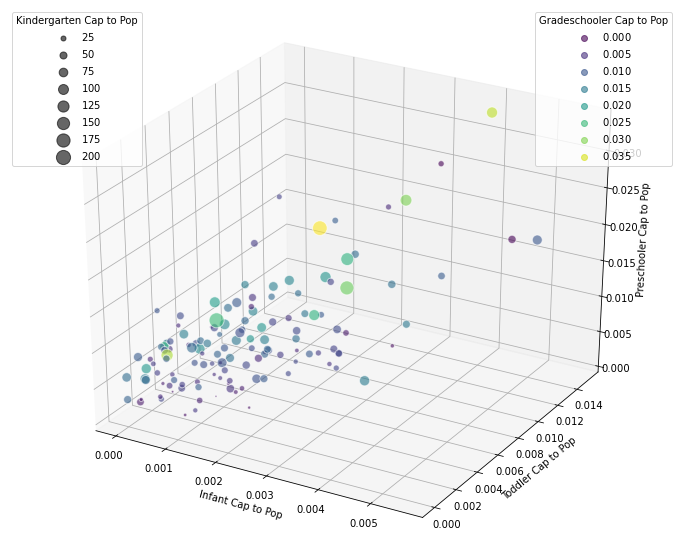

In [58]:
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111, projection ='3d')

xs = df_tor_ccs_nbh_merge['inf_ctp']
ys = df_tor_ccs_nbh_merge['tod_ctp']
zs = df_tor_ccs_nbh_merge['pre_ctp']

size = df_tor_ccs_nbh_merge['kin_ctp']*10000
color = df_tor_ccs_nbh_merge['gra_ctp'].astype(np.float)

scatter = ax.scatter(xs, ys, zs, s=size, alpha=0.6, c = color, edgecolors = 'w')

legend1 = ax.legend(*scatter.legend_elements(),
                   loc="upper right", title = "Gradeschooler Cap to Pop")
ax.add_artist(legend1)

handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
legend2 = ax.legend(handles, labels, loc="upper left", title="Kindergarten Cap to Pop")

ax.set_xlabel('Infant Cap to Pop')
ax.set_ylabel('Toddler Cap to Pop')
ax.set_zlabel('Preschooler Cap to Pop')

plt.show()

Now to compare neighbourhoods on a map, lets take a look at the neighbourhood data again on a choropleth map using the Total Capacity by Population for each neighbourhood.

In [25]:
# test the neighbourhood data by showing a visualization of toronto neighbourhoods on a map
tor_ccs_map = folium.Map(location = [tor_lat,tor_lon], zoom_start = 11.2, tiles = 'OpenStreetMap', titles='Toronto City Neighbourhoods')

choropleth = folium.Choropleth(
    geo_data = df_tor_geo_json,
    name = 'choropleth',
    data = df_tor_ccs_nbh_merge,
    columns=['neighbourhood_name_code', 'tot_ctp'],
    key_on='properties.AREA_NAME',
    fill_color = 'YlGnBu',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    legend_name = 'Total Capacity of Childcare Services to Population Ratio: All Age Groups').add_to(tor_ccs_map)

# label each neighbourhood
folium.LayerControl().add_to(tor_ccs_map)

folium.GeoJson(
    df_tor_geo_json,
    name='geojson').add_to(tor_ccs_map)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields = ['AREA_NAME'], 
        aliases = ['Neighbourhood:'],
        localize = True,
        stickly = False,
        labels = True,
        style = """
            background-color: #F0EFEF;
            border: 1px solid black;
            boder-radius: 1px;
            box-shadow: 3px;
            """))

# render the map
tor_ccs_map

#### 3.2 K-Means Clustering

With the full list of capacity by neighbourhood of Toronto childcare services by population we will now explore Toronto neighbourhoods with more services for young families. Utilizing a k-means clustering model we will use the capacity by each age group to determine which neighbourhoods offer more capacity for young families that would like to utilize childcare services. This model will help group each of the respective neighbourhoods by the services they support.

K-means clustering identifies data points based on the similarities, which is a valuable tool for identifying similar neighbourhoods based on specific characteristics. In this case we will use the __the childcare service capacity by population__ ration for the individual age groups to group the different neighbourhoods. From there we will be able to determine the level of support for young families and identify patterns that exist across the city of Toronto.

#### Identifying Similar Neighbourhoods based on Childcare Service Capacity by Population: K-Means

In this section we will walk walkthrough a k-menas clustering model for identifying the similar neighbourhoods.

We will use 5 clusters to apply cluster labels to the data.

The features used in the clustering model will be as follows:
* __Infant capacity to population:__ inf_ctp
* __Toddler capacity to population:__ tod_ctp
* __Preschooler capacity to population:__ pre_ctp
* __Kindergarten capacity to population:__ kin_ctp
* __Gradeschooler capacity to population:__ gra_ctp

Note: Total capacity to population ratio has been dropped from this analysis as this variable is simply the sum of each of the individual variables.

In [26]:
# set variables needed for the model
clusters = 5
init = 12
df_tor_ccs_clustering = df_tor_ccs_nbh_merge.drop(['neighbourhood_name_code','neighbourhood_name','infant_cap','toddler_cap','preschooler_cap','kindergarten_cap','gradeschooler_cap','total_cap','pop_2016','tot_ctp'],1)

# run k-means clustering model
kmeans = KMeans(init='k-means++',n_clusters = clusters, n_init = init).fit(df_tor_ccs_clustering)

# check cluster lables generated for each row in the df_tor_ccs_clustering data frame
kmeans_labels = kmeans.labels_
print(kmeans_labels)

# check cluster centers generated
kmeans_cluster_centers = kmeans.cluster_centers_
print(kmeans_cluster_centers)

[0 0 1 2 2 2 0 0 1 3 0 2 0 2 3 0 3 2 2 2 0 1 0 0 0 1 2 0 4 1 1 0 2 2 0 1 0
 0 2 3 2 0 2 2 0 2 3 1 3 1 1 2 3 2 0 2 2 0 2 0 0 2 3 2 1 0 2 2 1 1 1 0 1 0
 2 2 2 1 0 2 2 0 3 2 1 0 0 0 4 0 0 2 1 1 1 1 0 1 0 4 2 2 0 2 2 0 4 0 1 0 2
 3 2 1 2 2 1 0 0 4 4 2 0 2 2 0 2 1 2 0 1 2 0 4 2 3 3 0 2 2]
[[0.00114138 0.00268005 0.00549297 0.0025714  0.00376676]
 [0.00136027 0.00466773 0.01023972 0.00898688 0.01652678]
 [0.00134485 0.0037676  0.00826012 0.00599144 0.00929776]
 [0.00298152 0.00897759 0.02022471 0.00573559 0.00729416]
 [0.00234923 0.00746145 0.01938176 0.01718619 0.03011444]]


In [27]:
# add cluster labels to df_tor_ccs_nbh_merge data frame to label each neighbourhood; we will add 1 to each of the clusters for ease of use on the Choropleth map to follow.
df_tor_ccs_nbh_merge['Cluster'] = kmeans.labels_ +1

df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster
0,Agincourt North (129),Agincourt North,6,50,152,116,195,519,29113,0.000206,0.001717,0.005221,0.003984,0.006698,0.017827,1
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20,90,248,34,75,467,23757,0.000842,0.003788,0.010439,0.001431,0.003157,0.019657,1
2,Alderwood (20),Alderwood,10,64,138,91,155,458,12054,0.000830,0.005309,0.011448,0.007549,0.012859,0.037996,2
3,Annex (95),Annex,10,70,248,170,164,662,30526,0.000328,0.002293,0.008124,0.005569,0.005372,0.021686,3
4,Banbury-Don Mills (42),Banbury-Don Mills,46,153,392,143,339,1073,27695,0.001661,0.005524,0.014154,0.005163,0.012240,0.038743,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),Wychwood,39,163,318,52,60,632,14349,0.002718,0.011360,0.022162,0.003624,0.004181,0.044045,4
136,Yonge-Eglinton (100),Yonge-Eglinton,30,81,192,62,85,450,11817,0.002539,0.006855,0.016248,0.005247,0.007193,0.038081,4
137,Yonge-St.Clair (97),Yonge-St.Clair,40,65,152,53,30,340,12528,0.003193,0.005188,0.012133,0.004231,0.002395,0.027139,1
138,York University Heights (27),York University Heights,70,135,232,163,281,881,27593,0.002537,0.004893,0.008408,0.005907,0.010184,0.031928,3


Our data frame now has a full list of neighbourhoods with our k-means cluster assigned. However, if you re-run the model the cluster numbers will change. This is due to the k-means model randomly assigning the cluster numbers to each cluster.

To order the clusters so we can consistently re-run the k-means model without having to re-work our analysis later on, we will re-lable the clusters based on the _mean tot_ctp_ of each.

In [28]:
# create a temporary data frame to map the cluster labels to the labels that will be ordered by cluster_tot_ctp _mean
df_cluster_sort = pd.DataFrame(data=None, columns=['Cluster', 'Cluster tot_ctp mean', 'Cluster Assigned'])
print(df_cluster_sort)

# add cluster labels to data frame
df_cluster_sort['Cluster'] = df_tor_ccs_nbh_merge['Cluster'].unique()
print(df_cluster_sort)

# using the cluster centers we can sum them together to get the cluster_tot_ctp_mean; this is possible as the individual location points of each cluster add up to the tot_ctp for each cluster
cluster_tot_ctp_mean = []

for i in range(len(kmeans_cluster_centers)):
    print(kmeans_cluster_centers[i].sum())
    cluster_tot_ctp_mean.append(kmeans_cluster_centers[i].sum())
    
print(cluster_tot_ctp_mean)
df_cluster_sort['Cluster tot_ctp mean'] = cluster_tot_ctp_mean
    
# sort the data frame by the cluster_tot_ctp_mean and assign new clusters
df_cluster_sort = df_cluster_sort.sort_values(by=['Cluster tot_ctp mean'])
df_cluster_sort['Cluster Assigned'] = [1,2,3,4,5]
df_cluster_sort = df_cluster_sort.drop(columns = 'Cluster tot_ctp mean')

df_cluster_sort

Empty DataFrame
Columns: [Cluster, Cluster tot_ctp mean, Cluster Assigned]
Index: []
   Cluster Cluster tot_ctp mean Cluster Assigned
0        1                  NaN              NaN
1        2                  NaN              NaN
2        3                  NaN              NaN
3        4                  NaN              NaN
4        5                  NaN              NaN
0.01565255171046108
0.04178136896037712
0.028661773731140393
0.04521356145531592
0.07649306496299793
[0.01565255171046108, 0.04178136896037712, 0.028661773731140393, 0.04521356145531592, 0.07649306496299793]


,Cluster,Cluster Assigned
0,1,1
2,3,2
1,2,3
3,4,4
4,5,5


In [29]:
# join the 'Cluster Assigned' data to the existing data frame
df_tor_ccs_nbh_merge = pd.merge(df_tor_ccs_nbh_merge, df_cluster_sort, how='left', on='Cluster')
df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
0,Agincourt North (129),Agincourt North,6,50,152,116,195,519,29113,0.000206,0.001717,0.005221,0.003984,0.006698,0.017827,1,1
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20,90,248,34,75,467,23757,0.000842,0.003788,0.010439,0.001431,0.003157,0.019657,1,1
2,Alderwood (20),Alderwood,10,64,138,91,155,458,12054,0.000830,0.005309,0.011448,0.007549,0.012859,0.037996,2,3
3,Annex (95),Annex,10,70,248,170,164,662,30526,0.000328,0.002293,0.008124,0.005569,0.005372,0.021686,3,2
4,Banbury-Don Mills (42),Banbury-Don Mills,46,153,392,143,339,1073,27695,0.001661,0.005524,0.014154,0.005163,0.012240,0.038743,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),Wychwood,39,163,318,52,60,632,14349,0.002718,0.011360,0.022162,0.003624,0.004181,0.044045,4,4
136,Yonge-Eglinton (100),Yonge-Eglinton,30,81,192,62,85,450,11817,0.002539,0.006855,0.016248,0.005247,0.007193,0.038081,4,4
137,Yonge-St.Clair (97),Yonge-St.Clair,40,65,152,53,30,340,12528,0.003193,0.005188,0.012133,0.004231,0.002395,0.027139,1,1
138,York University Heights (27),York University Heights,70,135,232,163,281,881,27593,0.002537,0.004893,0.008408,0.005907,0.010184,0.031928,3,2


### Examine the clusters
Now we will examine each cluster and assign a label based on the capacity to population ratio for each.
We use general descriptive statistics to help assign labels to each of the clusters.
Primarily we will look at the mean capacity to population ratios across each of the clusters to help compare the availabel childcare services available in each neighbourhood.

#### Cluster: "Low Childcare Support"
This cluster has the lowest capacity of childcare services by population across all capacity to   ratio across all neighbourhoods in this cluster.
Neighbourhoods in this cluster may not have the capacity needed for young families or are underserviced for the neighbourhoods childcare needs.

In [32]:
df_tor_ccs_nbh_merge.loc[df_tor_ccs_nbh_merge['Cluster Assigned'] == 1].describe()

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
count,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.000000,45.0,45.0
mean,24.644444,59.755556,125.800000,58.622222,91.000000,359.822222,22609.977778,0.001141,0.002680,0.005493,0.002571,0.003767,0.015653,1.0,1.0
std,27.957887,51.719592,107.836282,47.561582,77.085254,265.596694,13175.382933,0.000889,0.001535,0.002826,0.001784,0.001979,0.005588,0.0,0.0
min,0.000000,10.000000,16.000000,0.000000,0.000000,39.000000,6577.000000,0.000000,0.000711,0.001492,0.000000,0.000000,0.002735,1.0,1.0
25%,10.000000,25.000000,56.000000,26.000000,30.000000,178.000000,13362.000000,0.000450,0.001527,0.003237,0.001431,0.002395,0.012169,1.0,1.0
50%,20.000000,42.000000,96.000000,52.000000,75.000000,279.000000,18675.000000,0.001071,0.002413,0.004760,0.002510,0.003717,0.015718,1.0,1.0
75%,30.000000,80.000000,152.000000,91.000000,105.000000,436.000000,26274.000000,0.001609,0.002975,0.007596,0.003854,0.005245,0.019583,1.0,1.0
max,157.000000,295.000000,599.000000,206.000000,330.000000,1431.000000,65913.000000,0.003799,0.006842,0.012133,0.007217,0.007597,0.027139,1.0,1.0


#### Cluster: "Low to Moderate Childcare Support"
This cluster has a balanced capacity of childcare services across all age groups that grows progressively with each age group.<br>
However, the cluster has lower __mean capacity to population__ ratios compared to clusters other clusters.<br>
Neighbourhoods have capacity at all age groups to support young families but may not be able to support as many families overall as other neighbourhoods.

In [33]:
df_tor_ccs_nbh_merge.loc[df_tor_ccs_nbh_merge['Cluster Assigned'] == 2].describe()

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
count,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.000000,49.0,49.0
mean,28.857143,77.306122,169.469388,119.265306,185.081633,579.979592,20049.551020,0.001345,0.003768,0.008260,0.005991,0.009298,0.028662,3.0,2.0
std,25.117225,48.713107,97.851312,56.927503,83.629350,276.796066,8504.254759,0.000952,0.001537,0.002530,0.001649,0.001908,0.004252,0.0,0.0
min,0.000000,0.000000,24.000000,36.000000,65.000000,166.000000,7865.000000,0.000000,0.000000,0.003051,0.002648,0.005292,0.021106,3.0,2.0
25%,10.000000,45.000000,88.000000,78.000000,116.000000,366.000000,13593.000000,0.000556,0.002955,0.006725,0.005051,0.007909,0.025981,3.0,2.0
50%,26.000000,70.000000,170.000000,111.000000,180.000000,546.000000,17757.000000,0.001243,0.003790,0.008024,0.005907,0.009201,0.028316,3.0,2.0
75%,36.000000,95.000000,216.000000,156.000000,240.000000,733.000000,27446.000000,0.001997,0.004685,0.009865,0.006619,0.010710,0.031418,3.0,2.0
max,110.000000,270.000000,546.000000,274.000000,444.000000,1564.000000,43965.000000,0.003220,0.006498,0.014154,0.009829,0.012855,0.039478,3.0,2.0


#### Cluster: "Moderate and Balanced Childcare Support"
This neighbourhood has a more balanced capacity of childcare services by population looking at the _tot_ctp_ ratio across all neighbourhoods in this cluster.

In [34]:
df_tor_ccs_nbh_merge.loc[df_tor_ccs_nbh_merge['Cluster Assigned'] == 3].describe()

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
count,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.00000,27.000000,27.000000,27.000000,27.000000,27.000000,27.000000,27.0,27.0
mean,22.703704,79.296296,177.037037,153.925926,275.888889,708.851852,17182.00000,0.001360,0.004668,0.010240,0.008987,0.016527,0.041781,2.0,3.0
std,16.797012,42.031870,91.151388,72.067237,101.063321,281.116962,7246.79855,0.001015,0.001766,0.003360,0.002105,0.003110,0.006642,0.0,0.0
min,0.000000,20.000000,62.000000,52.000000,131.000000,315.000000,7804.00000,0.000000,0.001518,0.004250,0.005157,0.012454,0.031022,2.0,3.0
25%,10.000000,45.000000,95.000000,105.500000,202.500000,456.000000,11280.50000,0.000846,0.003363,0.007660,0.006953,0.014494,0.037517,2.0,3.0
50%,20.000000,80.000000,179.000000,130.000000,247.000000,641.000000,16472.00000,0.001281,0.004874,0.009680,0.009237,0.015674,0.040908,2.0,3.0
75%,38.000000,110.000000,233.500000,208.000000,355.500000,955.000000,21474.00000,0.001828,0.005662,0.012620,0.010410,0.018664,0.044735,2.0,3.0
max,66.000000,195.000000,370.000000,375.000000,500.000000,1196.000000,34805.00000,0.003946,0.009120,0.016553,0.012360,0.024269,0.057404,2.0,3.0


#### Cluster: "High Newborn Childcare Support"
This cluster has the __highest childcare services mean__ for infant, toddler, and preschool looking at the capacity to population ratios across all clusters.<br>
However, this neighbourhood does not have as many services available for kindergarten and gradeschooler age groups.<br>
Therefore it is more heavily weighed toward supporting new born children and families that are having their children from age 3 months to 4 years.

In [35]:
df_tor_ccs_nbh_merge.loc[df_tor_ccs_nbh_merge['Cluster Assigned'] == 4].describe()

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
count,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.0,12.0
mean,43.750000,136.416667,316.916667,90.083333,125.500000,712.666667,15697.750000,0.002982,0.008978,0.020225,0.005736,0.007294,0.045214,4.0,4.0
std,22.291968,49.074078,111.597050,40.214105,79.198829,240.116765,4641.711697,0.001447,0.002771,0.003401,0.001853,0.004460,0.006551,0.0,0.0
min,20.000000,64.000000,170.000000,35.000000,0.000000,347.000000,7727.000000,0.000861,0.004439,0.014982,0.003357,0.000000,0.032462,4.0,4.0
25%,30.000000,103.750000,237.750000,59.500000,71.250000,463.500000,13716.000000,0.002066,0.007392,0.016866,0.004229,0.004947,0.042617,4.0,4.0
50%,39.500000,134.000000,300.500000,84.500000,155.000000,774.000000,16249.000000,0.002717,0.009093,0.021885,0.005799,0.007147,0.045859,4.0,4.0
75%,49.500000,156.250000,397.000000,117.000000,179.250000,872.000000,17845.250000,0.003716,0.011090,0.022133,0.006775,0.010565,0.048355,4.0,4.0
max,100.000000,230.000000,514.000000,178.000000,225.000000,1055.000000,23236.000000,0.005573,0.013814,0.026441,0.009919,0.013413,0.058791,4.0,4.0


#### Cluster: "High Childcare Support"
This cluster has a high ratio of capacity of childcare services across all age groups of young children.<br>
Neighbourhoods in this cluster have the highest total capacity by population and would have services available to support young families from new born children to 12 year olds in Before and After school programs.

In [36]:
df_tor_ccs_nbh_merge.loc[df_tor_ccs_nbh_merge['Cluster Assigned'] == 5].describe()

,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned
count,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.0,7.0
mean,26.000000,80.142857,212.714286,196.428571,333.142857,848.428571,11343.857143,0.002349,0.007461,0.019382,0.017186,0.030114,0.076493,5.0,5.0
std,15.491933,39.121301,89.697109,66.577917,51.725005,179.924852,2811.130107,0.001361,0.004293,0.008758,0.003979,0.004739,0.014672,0.0,0.0
min,0.000000,30.000000,60.000000,94.000000,255.000000,617.000000,7607.000000,0.000000,0.002392,0.005429,0.012357,0.023738,0.055832,5.0,5.0
25%,18.000000,46.500000,170.500000,161.000000,297.000000,733.500000,9868.000000,0.001631,0.004564,0.015611,0.014033,0.026967,0.067324,5.0,5.0
50%,30.000000,85.000000,212.000000,189.000000,355.000000,816.000000,11051.000000,0.002778,0.007248,0.019328,0.016489,0.029792,0.074591,5.0,5.0
75%,35.000000,116.500000,278.000000,244.000000,367.500000,943.500000,12228.500000,0.003230,0.009172,0.023282,0.020452,0.033049,0.086156,5.0,5.0
max,46.000000,120.000000,320.000000,282.000000,393.000000,1152.000000,16556.000000,0.003944,0.015118,0.033127,0.022486,0.037239,0.098068,5.0,5.0


***

# 4. Results

#### Add Cluster name labels to the data and map

After examining each cluster providing a label based on the mean capacity to population for each cluster, we will now add these labels back to the data frame.

Once added to the dataframe we will remap the clusters to the map and have a full picture of Toronto Neighbourhoods based on childcare service support for young families.

In [37]:
# add cluster label names
# relabel the clusters from lowest to highest; clusters 1 and 5 are already labelled appropriately
df_tor_ccs_nbh_merge['Cluster Name'] = np.where(df_tor_ccs_nbh_merge['Cluster Assigned'] == 1, 'Low Childcare Support', 
                                           np.where(df_tor_ccs_nbh_merge['Cluster Assigned'] == 2, 'Low to Moderate Childcare Support', 
                                                    np.where(df_tor_ccs_nbh_merge['Cluster Assigned'] == 3, 'Moderate and Balanced Childcare Support', 
                                                                 np.where(df_tor_ccs_nbh_merge['Cluster Assigned'] == 4, 'High Newborn Childcare Support', 
                                                                          np.where(df_tor_ccs_nbh_merge['Cluster Assigned'] == 5, 'High Childcare Support', 'Error')))))

df_tor_ccs_nbh_merge

,neighbourhood_name_code,neighbourhood_name,infant_cap,toddler_cap,preschooler_cap,kindergarten_cap,gradeschooler_cap,total_cap,pop_2016,inf_ctp,tod_ctp,pre_ctp,kin_ctp,gra_ctp,tot_ctp,Cluster,Cluster Assigned,Cluster Name
0,Agincourt North (129),Agincourt North,6,50,152,116,195,519,29113,0.000206,0.001717,0.005221,0.003984,0.006698,0.017827,1,1,Low Childcare Support
1,Agincourt South-Malvern West (128),Agincourt South-Malvern West,20,90,248,34,75,467,23757,0.000842,0.003788,0.010439,0.001431,0.003157,0.019657,1,1,Low Childcare Support
2,Alderwood (20),Alderwood,10,64,138,91,155,458,12054,0.000830,0.005309,0.011448,0.007549,0.012859,0.037996,2,3,Moderate and Balanced Childcare Support
3,Annex (95),Annex,10,70,248,170,164,662,30526,0.000328,0.002293,0.008124,0.005569,0.005372,0.021686,3,2,Low to Moderate Childcare Support
4,Banbury-Don Mills (42),Banbury-Don Mills,46,153,392,143,339,1073,27695,0.001661,0.005524,0.014154,0.005163,0.012240,0.038743,3,2,Low to Moderate Childcare Support
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wychwood (94),Wychwood,39,163,318,52,60,632,14349,0.002718,0.011360,0.022162,0.003624,0.004181,0.044045,4,4,High Newborn Childcare Support
136,Yonge-Eglinton (100),Yonge-Eglinton,30,81,192,62,85,450,11817,0.002539,0.006855,0.016248,0.005247,0.007193,0.038081,4,4,High Newborn Childcare Support
137,Yonge-St.Clair (97),Yonge-St.Clair,40,65,152,53,30,340,12528,0.003193,0.005188,0.012133,0.004231,0.002395,0.027139,1,1,Low Childcare Support
138,York University Heights (27),York University Heights,70,135,232,163,281,881,27593,0.002537,0.004893,0.008408,0.005907,0.010184,0.031928,3,2,Low to Moderate Childcare Support


#### Results of Neighbourhood Clusters

With the clusters assigned and labeled, it is now visible which neighbourhoods have higher capacity to support young families and those with lower to moderate support.

Taking a look at the Choropleth map below, it is apparent that there are neighbourhoods with higher support for childcare services than others.

In the immediate downtown neighbourhoods of Church-Yonge Corridor, Baystreet Corridor, Waterfront Communities and Islands, there is low support for childcare services. Once you move away from the downtown core neighbourhoods the support for childcare services increases. Specifically, pockets of increased childcare service capacity by population exist in neighbourhoods: 
* Directly east of the city and Don Valley Parkway 
* West of the city close to High Park, Mimico, and the Junction, and 
* North / North East of the city

As you move Northwest and to the neighbourhoods on the boundaries of city limits, childcare support services show lower support.

In [38]:
# create toronto neighbourhood map using the cluster information
tor_ccs_map = folium.Map(location = [tor_lat,tor_lon], zoom_start = 11.2, tiles = 'OpenStreetMap', titles='Toronto City Neighbourhoods')

choropleth = folium.Choropleth(
    geo_data = df_tor_geo_json,
    name = 'choropleth',
    data = df_tor_ccs_nbh_merge,
    columns=['neighbourhood_name_code', 'Cluster Assigned'],
    key_on='properties.AREA_NAME',
    fill_color = 'YlGn',
    fill_opacity = 0.7,
    line_opacity = 0.2,
    bins = [1,2,3,4,5,6],
    legend_name = 'Toronto Neighbourhoods by KMeans Clusters',
    highlight = True,
    ).add_to(tor_ccs_map)

# label each neighbourhood
folium.LayerControl().add_to(tor_ccs_map)

folium.GeoJson(
    df_tor_geo_json,
    name='geojson').add_to(tor_ccs_map)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(
        fields = ['AREA_NAME'], 
        aliases = ['Neighbourhood:'],
        localize = True,
        stickly = False,
        labels = True,
        style = """
            background-color: #F0EFEF;
            border: 1px solid black;
            boder-radius: 1px;
            box-shadow: 3px;
            """))

# render the map
tor_ccs_map

#### Comparing clusters to initial exploratory analysis of Cap to Pop ratios

Looking at the 5-dimensional plot again and substituting the "Cluster Labels" for the "Grade-schooler to Cap Ratio" we can see the clusters largely align with the initial exploratory analysis.

Smaller dots appear more often in the bottom left corner of the plot (neighbourhoods with lower cap to pop ratios) while the larger dots appear closer to the top right corner.

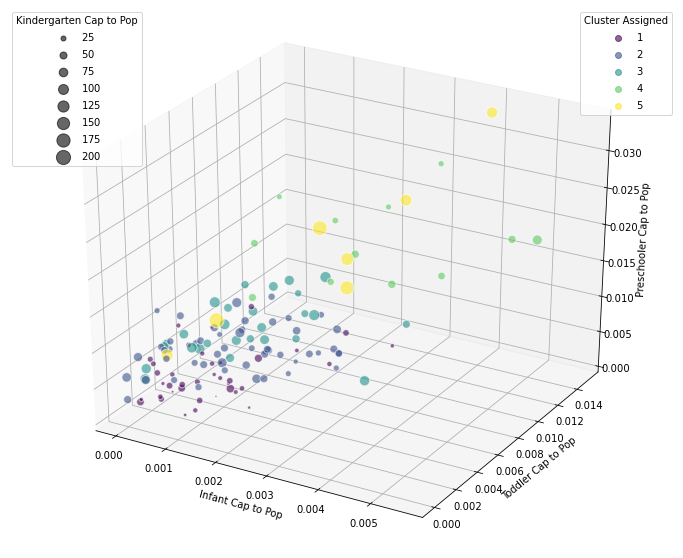

In [61]:
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111, projection ='3d')

xs = df_tor_ccs_nbh_merge['inf_ctp']
ys = df_tor_ccs_nbh_merge['tod_ctp']
zs = df_tor_ccs_nbh_merge['pre_ctp']

size = df_tor_ccs_nbh_merge['kin_ctp']*10000
color = df_tor_ccs_nbh_merge['Cluster Assigned'].astype(np.float)

scatter = ax.scatter(xs, ys, zs, s=size, alpha=0.6, c = color, edgecolors = 'w')

legend1 = ax.legend(*scatter.legend_elements(),
                   loc="upper right", title = "Cluster Assigned")
ax.add_artist(legend1)

handles, labels = scatter.legend_elements(prop="sizes", alpha=0.6)
legend2 = ax.legend(handles, labels, loc="upper left", title="Kindergarten Cap to Pop")

ax.set_xlabel('Infant Cap to Pop')
ax.set_ylabel('Toddler Cap to Pop')
ax.set_zlabel('Preschooler Cap to Pop')

plt.show()